In [1]:
import numpy as np
import seaborn as sns; sns.set(color_codes=True)
import matplotlib.pyplot as plt
import random
import os
import re
import sys
import umap
import pandas as pd
from os.path import join, basename
from glob import glob
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.mixture import GaussianMixture
from collections import Counter
from random import sample

/usr/local/lib/python3.7/site-packages/matplotlib/__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


## 1. Test Combat Normalization using Heatmap

In [8]:
ori = np.load("./resource/normalization/features_3_4.npz")
feature = np.concatenate((ori['features_3'], ori['features_3_dmso'],
                          ori['features_4'], ori['features_4_dmso']))
name = np.concatenate((ori['names_3'], ori['names_3_dmso'],
                       ori['names_4'], ori['names_4_dmso']))
feature.shape

(41410, 4096)

In [9]:
label = ["batch_3" for i in range(len(ori['features_3']))] + \
        ["batch_3_dmso" for i in range(len(ori['features_3_dmso']))] + \
        ["batch_4" for i in range(len(ori['features_4']))] + \
        ["batch_4_dmso" for i in range(len(ori['features_4_dmso']))]

In [21]:
new = np.load("./resource/normalization/ls_transformed.npz")
new_feature = new["result"]
new_feature.shape

In [31]:
top_ind = random.sample(range(1, 41410//2), 2048)
bot_ind = random.sample(range(41410//2, 41410), 2048)

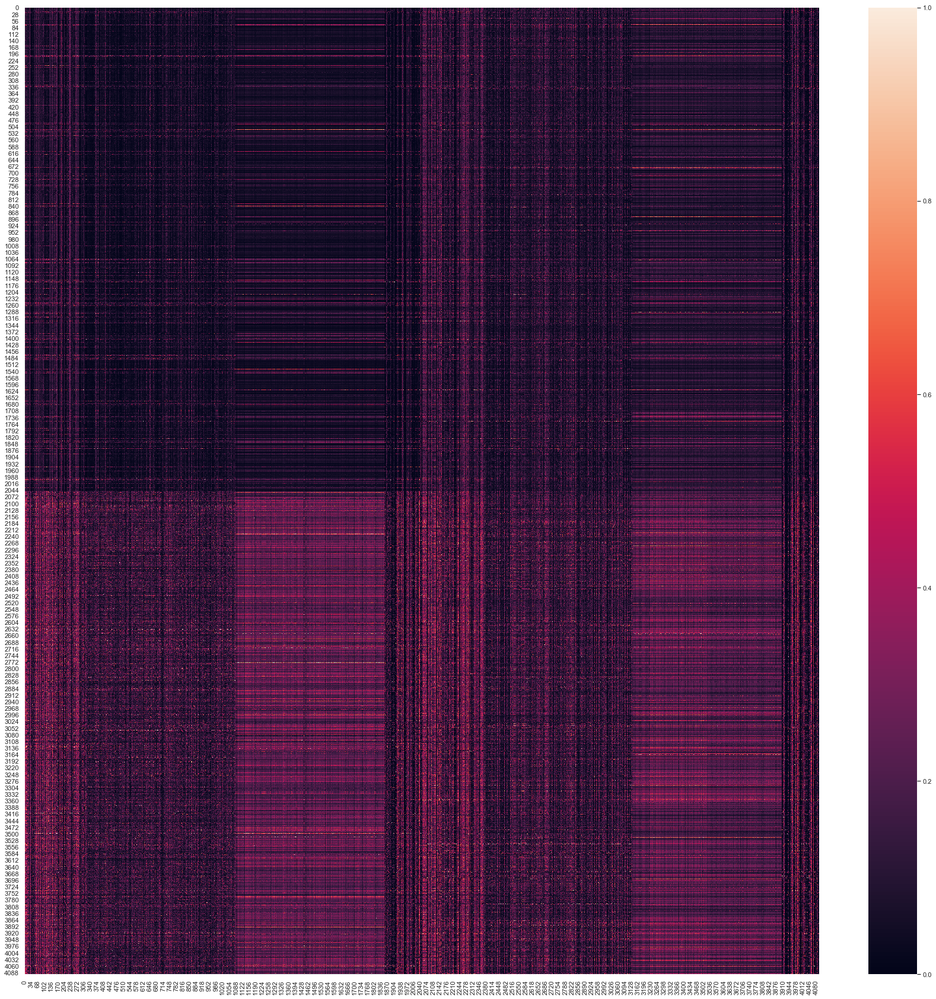

In [32]:
tt = np.concatenate((feature[top_ind,:], feature[bot_ind,:]))
tt_normed = (tt - tt.min(0)) / tt.ptp(0)
fig, ax = plt.subplots(figsize=(30,30)) 
ax = sns.heatmap(tt_normed, vmin=0, vmax=1, ax=ax)

In [17]:
np.max(feature)

30483.256

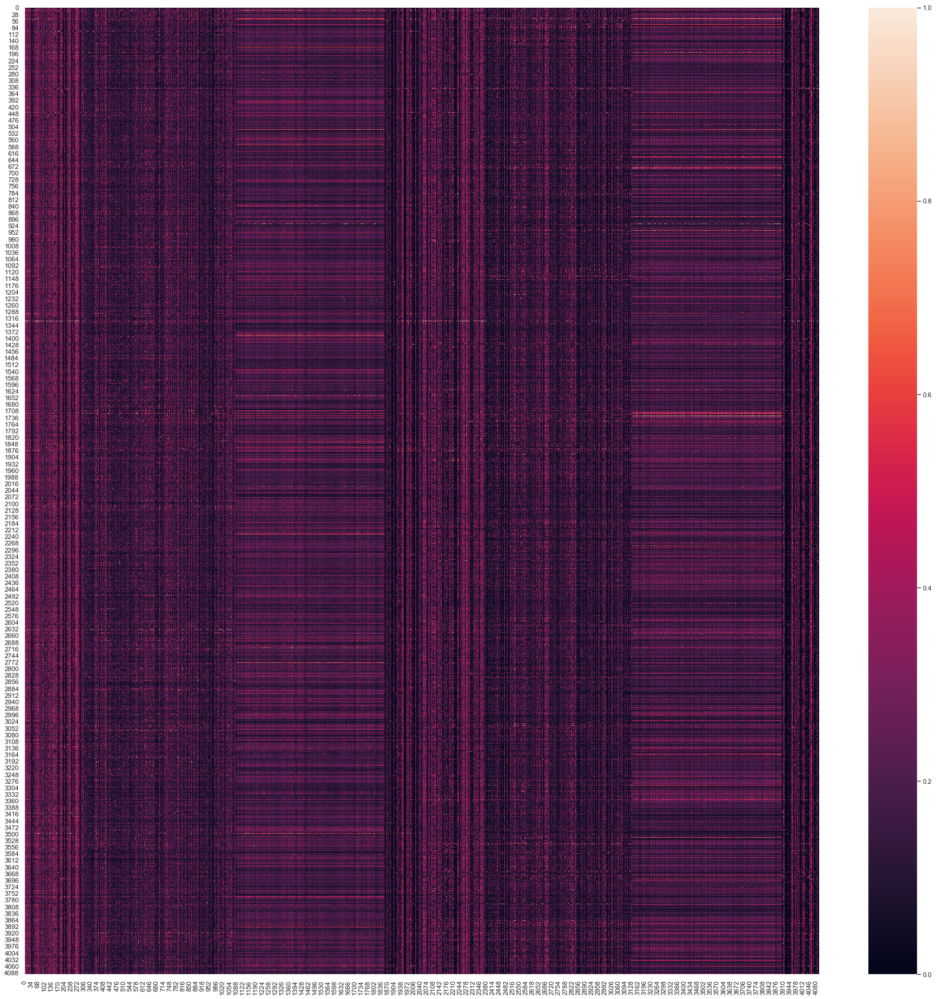

In [33]:
tt = np.concatenate((new_feature[top_ind,:], new_feature[bot_ind,:]))
tt_normed = (tt - tt.min(0)) / tt.ptp(0)
fig, ax = plt.subplots(figsize=(30,30)) 
ax = sns.heatmap(tt_normed, vmin=0, vmax=1, ax=ax)

## 2. Test Normalization Using UMAP

In [5]:
def umap_reduction(x, labels, output_dir, save_name, pca_d=100, dim=2, n_neighbors=15):
    """
    Reduce high dimension to 2D or 3D using umap.
    Args:
        x: an np array (num_sample, num_feature)
        labels: the categorical attribute of the rows in x
    """
    # Use PCA to reduce dimensions to 50
    if x.shape[1] > pca_d:
        print("Using PCA to reduce dimension to {}.".format(pca_d))
        pca = PCA(n_components=pca_d)
        x = pca.fit_transform(x)

        print("After PCA, {:2f} of original variance remains.".format(
            np.sum(pca.explained_variance_ratio_)
        ))

    # t-sne reduction
    x = umap.UMAP().fit_transform(x)

    df = pd.DataFrame(x, columns=['x', 'y', 'z'][:dim])
    df['label'] = labels

    # Save the df
    df.to_csv(join(output_dir, save_name),
              index=False)

In [28]:
umap_reduction(feature, label, "./", "before.csv")

Using PCA to reduce dimension to 100.
After PCA, 0.958456 of original variance remains.


In [30]:
umap_reduction(new_feature, label, "./", "after_combat.csv")

Using PCA to reduce dimension to 100.
After PCA, 0.906586 of original variance remains.


<img src="./plots/before.png" width=50%>
<img src="./plots/after_combatP.png" width=50%>

## 3. Non-parametric Combat Normalization

Other people have seen good results of removing batch effects using non-parametric combat (combatN). We can try this method in addition to combatP.

The transformation takes 5 hours to run on condor (for only 10 plates).

In [3]:
new = np.load("./resource/normalization/combatN_transformed.npz")
new_feature = new["result"]
new_feature.shape

(41410, 4096)

In [18]:
np.all(np.isnan(new_feature))

True

All entries in the result matrix are NA. It seems combatN failed to find adjustments.

## 4. Mean Normalization

In this section, we try to use the mean normalization formula given in the paper [Removing Batch Effects From Histopathological Images for Enhanced Cancer Diagnosis](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5003052/).

$$\hat{Y^{i,b}_f} = \frac{1}{2} \left(\frac{\left(Y^{i,b}_f - \mu_f^b\right)}{3\sigma^b_f} + 1 \right)$$

Where $Y^{i,b}_f$ is the $f$ feature of image $i$ in batch $b$.

$\mu_f^b$ and $\sigma^b_f$ are sample(batch) mean and standard deviation of feature $f$.

In [35]:
batch_3_len = len(ori['features_3']) + len(ori['features_3_dmso'])
batch_4_len = len(ori['features_4']) + len(ori['features_4_dmso'])

In [70]:
mu_b3 = np.mean(feature[:batch_3_len, :], axis=0)
mu_b4 = np.mean(feature[batch_3_len:, :], axis=0)

sigma_b3 = np.std(feature[:batch_3_len, :], axis=0, ddof=1)
sigma_b4 = np.std(feature[:batch_4_len, :], axis=0, ddof=1)

# Replace 0 to a small number in the sd's
sigma_b3 = np.array([i if i != 0 else 1e-6 for i in sigma_b3])
sigma_b4 = np.array([i if i != 0 else 1e-6 for i in sigma_b4])

In [72]:
mean_norm_feature_3 = ((feature[:batch_3_len, :] - mu_b3) / (3 * sigma_b3) + 1) / 2
mean_norm_feature_4 = ((feature[batch_3_len:, :] - mu_b4) / (3 * sigma_b4) + 1) / 2

In [83]:
mean_norm_feature = np.vstack((mean_norm_feature_3, mean_norm_feature_4))

In [78]:
?np.stack

In [55]:
mean_norm_feature_3

array([[-52.06811  ,  -8.807098 ,  14.248186 , ..., 141.50093  ,
         -2.0211039,  97.59275  ],
       [-27.55645  , -10.10004  ,  19.340742 , ...,  -3.6521606,
         -2.0211039,  -5.778221 ],
       [ 22.172539 ,  -8.8419   ,   6.8571014, ...,  -3.6521606,
         -0.2507435, -17.05913  ],
       ...,
       [ 30.14685  ,   3.4483414, -13.424458 , ...,  -3.6521606,
         -2.0211039,  51.860374 ],
       [-50.154095 ,  -9.227888 , -25.03847  , ...,  -1.9733915,
         -2.0211039,  -6.856325 ],
       [-57.990856 ,   8.358765 , -10.667318 , ...,  -3.6521606,
         -2.0211039, -20.383532 ]], dtype=float32)

In [87]:
print("shape: {}, min: {}, max: {}".format(mean_norm_feature.shape, 
                                           np.min(mean_norm_feature),
                                           np.max(mean_norm_feature)))

shape: (41410, 4096), min: -0.5376725749113676, max: 33.048221588134766


In [88]:
umap_reduction(mean_norm_feature, label, "./", "after_mean.csv")

Using PCA to reduce dimension to 100.
After PCA, 0.786957 of original variance remains.


<img src="./plots/after_mean.png" width=50%>

## 5. Traditional Normalization

In this section, we try to adopt the strategy mentioned in this [paper](https://www.nature.com/articles/nmeth.4397#f4).

### 5.1. Distance matrix

The first step is to detect the batch effect by inspecting correlations among profiles. Here our profiles are the 4096 vector for each image. One easy way is to aggregate the negative control features within each plate, then compare them across plates.

In [2]:
data = np.load("./resource/combined_feature_349_e1.npz")
[k for k in data.keys()]

['features', 'names', 'sids']

In [48]:
# Get the DMSO index
dmso_index = [True if "DMSO" in d else False for d in data["names"]]
dmso_names = np.array(data["names"])[dmso_index]
dmso_sids = np.array(data["sids"])[dmso_index]

In [5]:
features = data["features"]

In [49]:
dmso_features = features[dmso_index]
dmso_features.shape

(190783, 4096)

In [51]:
# Then we want to aggregate the features within each plate
pids = set()
for name in data["names"]:
    try:
        pids.add(int(re.sub(r'(\d{5})_.+', r'\1', name)))
    except:
        print(name)
        break

dmso_feature_dict = {}
feature_dict = {}
for p in pids:
    dmso_feature_dict[p] = []
    feature_dict[p] = []

In [52]:
names = data["names"]
for i in range(len(names)):
    pid = int(re.sub(r'(\d{5})_.+', r'\1', names[i]))
    if "DMSO" in names[i]:
        dmso_feature_dict[pid].append(features[i, :])
    feature_dict[pid].append(features[i, :])

In [57]:
# It is recommended to use median to aggregate features
feature_median = []

for p in dmso_feature_dict:
    cur_median = np.median(np.vstack(dmso_feature_dict[p]), axis=0)
    feature_median.append((p, cur_median))

feature_median_sorted = sorted(feature_median, key=lambda x:x[0])

sorted_dmso_median_feature = np.vstack([i[1] for i in feature_median_sorted])
sorted_dmso_median_pid = [i[0] for i in feature_median_sorted]

dmso_feature_cor = np.corrcoef(sorted_dmso_median_feature, rowvar=True)

df = pd.DataFrame(dmso_feature_cor)
df.columns = sorted_dmso_median_pid
df.index = sorted_dmso_median_pid

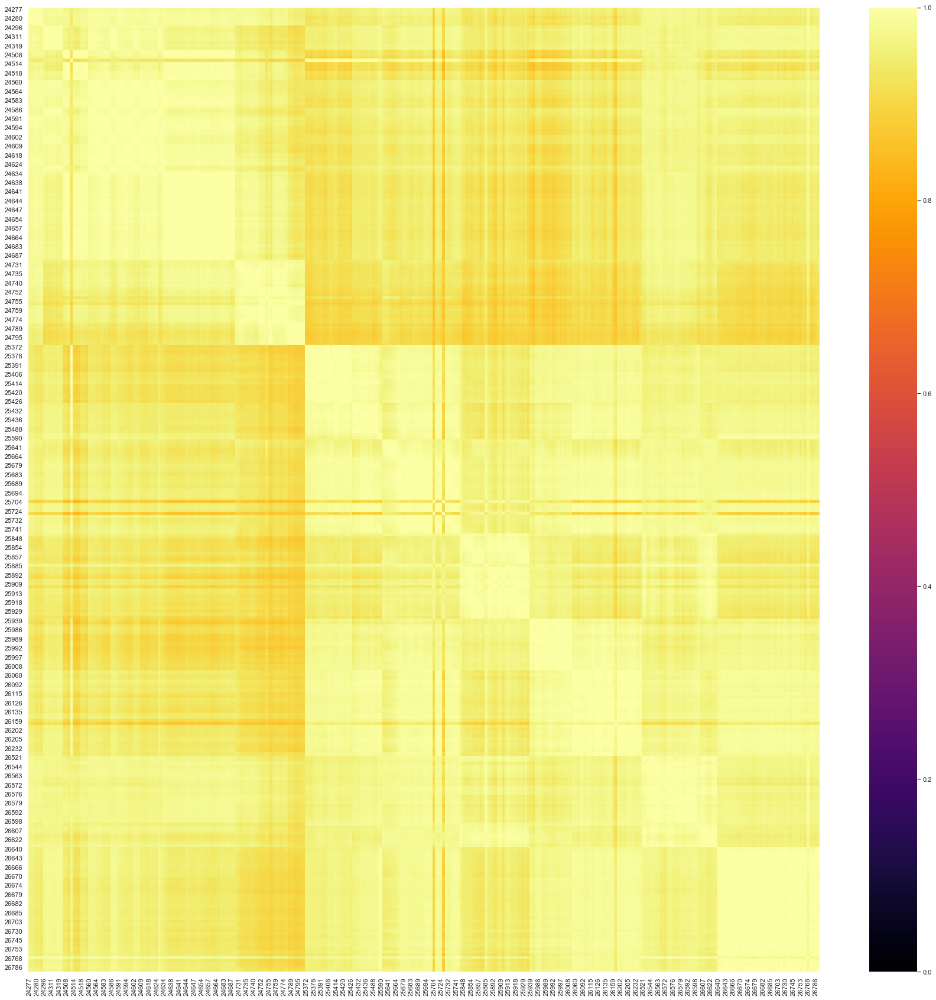

In [103]:
fig, ax = plt.subplots(figsize=(30,30)) 
ax = sns.heatmap(df, vmin=0, vmax=1, cmap="inferno", ax=ax)

In [114]:
fig.savefig('./plots/feature_median_cor_317.png', bbox_inches="tight")

## 5.2. Inspect 0-variance DMSO

Some DMSO features have 0 variance within one plate.

In [64]:
dmso_stats = np.load("./scripts/z_score_norm_dicts.npz")
dmso_sd_dict = dmso_stats["dmso_sd_dict"].item()

In [45]:
zero_var_dict = {}
for k in dmso_sd_dict:
    cur_sd = dmso_sd_dict[k]
    if 0 in cur_sd:
        zero_var_dict[k] = np.where(cur_sd == 0)[0]

In [12]:
features = data["features"]

In [44]:
for p in [24583, 24584, 24585, 24590, 24591]:
#for p in [24583]:
    index_p = [True if str(p) in d else False for d in data["names"]]
    feature_p = features[index_p]
    name_p = data["names"][index_p]
    index_p_dmso = [True if 'DMSO' in d else False for d in name_p]
    feature_p_dmso = feature_p[index_p_dmso]
    for zero_col in zero_var_dict[p]:
        print(p, zero_col, np.var(feature_p_dmso[:, zero_col]), np.var(feature_p[:, zero_col]))

24583 1895 0.0 0.04356823
24583 2243 0.0 0.7305793
24583 3943 0.0 0.0
24583 3963 0.0 0.29522476
24584 1895 0.0 0.023826132
24584 2243 0.0 0.3314596
24585 3943 0.0 0.035786465
24590 1895 0.0 0.41240606
24590 2243 0.0 0.886379
24590 3943 0.0 0.041437645
24591 3943 0.0 0.0


We can see that some plates do have non-zero variance in treated images while having zero variance in the negative control.

One solution is to use the standard deviation of all images (control+treated) to normalize those special features in those very plates.

Check this [thread](https://forum.image.sc/t/normalizing-population-has-0-standard-deviation/22457/3) for other suggestions.

## 5.3. Z-score Normalization

The [paper](https://www.nature.com/articles/nmeth.4397#f4) recommended us to use the mean and standard deviation from the negative control sample to normalize within plates.

In [ ]:
features = data["features"]

In [ ]:
dmso_index = [True if "DMSO" in d else False for d in data["names"]]
dmso_names = np.array(data["names"])[dmso_index]
dmso_sids = np.array(data["sids"])[dmso_index]

In [71]:
dmso_mean_dict = {}
dmso_sd_dict = {}
problem_sd_dict = {}

for p in pids:
    dmso_mean_dict[p] = np.mean(dmso_feature_dict[p], axis=0)
    dmso_sd_dict[p] = np.std(dmso_feature_dict[p], axis=0)
    
    if 0 in dmso_sd_dict[p]:
        for col in np.where(dmso_sd_dict[p] == 0)[0]:
            dmso_mean_dict[p][col] = np.mean(np.vstack(feature_dict[p])[:, col])
            dmso_sd_dict[p][col] = np.std(np.vstack(feature_dict[p])[:, col])
            
            # If the sd of all images is still 0, then we just don't normalize this feature
            # and add it to a special list
            if np.std(np.vstack(feature_dict[p])[:, col]) == 0:
                dmso_mean_dict[p][col] = 0
                dmso_sd_dict[p][col] = 1
                print(p, col)
                if p in problem_sd_dict:
                    problem_sd_dict[p].append(col)
                else:
                    problem_sd_dict[p] = [col]

# Need to 
np.savez("z_score_norm_dicts.npz", dmso_mean_dict=dmso_mean_dict, dmso_sd_dict=dmso_sd_dict)

24583 3943
24591 3943
24592 1895
24592 3943
24593 1895
24595 1895


KeyboardInterrupt: 

In [54]:
# Then we want to aggregate the features within each plate
pids = set()
for name in dmso_names:
    try:
        pids.add(int(re.sub(r'(\d{5})_.+', r'\1', name)))
    except:
        print(name)
        break

feature_dict = {}
for p in pids:
    feature_dict[p] = []

In [55]:
for i in range(len(dmso_names)):
    pid = int(re.sub(r'(\d{5})_.+', r'\1', dmso_names[i]))
    feature_dict[pid].append(dmso_features[i, :])

## 6. Use Gaussian Mixture Model to Detect Outliers

In [2]:
df = pd.read_csv("./resource/plate_406_features_normed.csv")
df.head()

,x,y,label,label_2
0,-0.803761,-1.211384,25567_DMSO_l02,2
1,-2.405315,4.644505,25567_DMSO_l02,6
2,-2.438617,-1.397599,25567_DMSO_l02,3
3,1.195459,3.395290,25567_DMSO_l02,1
4,-1.450219,-1.935879,25567_DMSO_l02,4


In [4]:
# Split the df into DMSO and non-DMSO entries
labels = df['label']
labels_2 = df['label_2']
dmso_index = [True if 'DMSO' in i else False for i in labels]
dmso_df = df.iloc[dmso_index,:]
nondmso_df = df.iloc[np.invert(dmso_index), :]

In [5]:
# Compile the (x, y) pairs
dmso_df_x = dmso_df['x'].tolist()
dmso_df_y = dmso_df['y'].tolist()
dmso_pairs = [[dmso_df_x[i], dmso_df_y[i]] for i in range(dmso_df.shape[0])]
dmso_pairs = np.vstack(dmso_pairs)

nondmso_df_x = nondmso_df['x'].tolist()
nondmso_df_y = nondmso_df['y'].tolist()
nondmso_pairs = [[nondmso_df_x[i], nondmso_df_y[i]] for i in range(nondmso_df.shape[0])]
nondmso_pairs = np.vstack(nondmso_pairs)

In [6]:
# Train a 2D Gaussian mixture model
gm = GaussianMixture(n_components=1, max_iter=1000, verbose=1)
gm.fit(dmso_pairs)

Initialization 0
Initialization converged: True


GaussianMixture(covariance_type='full', init_params='kmeans', max_iter=1000,
        means_init=None, n_components=1, n_init=1, precisions_init=None,
        random_state=None, reg_covar=1e-06, tol=0.001, verbose=1,
        verbose_interval=10, warm_start=False, weights_init=None)

In [7]:
nondmso_proba = gm.predict_proba(nondmso_pairs).reshape(-1)
Counter(nondmso_proba)

Counter({1.0: 755329})

If we only fit one component, then all the elements are predicted as 100% in the component. Let's try to use 2 components.

In [8]:
# Train a 2D Gaussian mixture model
gm = GaussianMixture(n_components=2, max_iter=1000, verbose=1)
gm.fit(dmso_pairs)

Initialization 0
Initialization converged: True


GaussianMixture(covariance_type='full', init_params='kmeans', max_iter=1000,
        means_init=None, n_components=2, n_init=1, precisions_init=None,
        random_state=None, reg_covar=1e-06, tol=0.001, verbose=1,
        verbose_interval=10, warm_start=False, weights_init=None)

In [9]:
nondmso_proba = gm.predict_proba(nondmso_pairs)
first_comp_proba = [i[0] for i in nondmso_proba]

In [10]:
non_dmso_plot_dict = {
    'x': nondmso_df_x,
    'y': nondmso_df_y,
    'prob': first_comp_proba,
    'component': [1 if i >= 0.5 else 2 for i in first_comp_proba]
}
non_dmso_plot_df = pd.DataFrame(non_dmso_plot_dict)
non_dmso_plot_df.to_csv('gaussian_2d_nondmso.csv', index=False)

In [11]:
# Get some interseting dots
intersting_index_1, intersting_index_2, intersting_index_3 = [], [], []

for i, v in nondmso_df['x'].iteritems():
    if v > 5:
        intersting_index_1.append(i)

for i, v in nondmso_df['y'].iteritems():
    if v < -5:
        intersting_index_2.append(i)
    elif v > 10:
        intersting_index_3.append(i)

print(len(intersting_index_1), len(intersting_index_2), len(intersting_index_3))

577 1123 47


In [12]:
# Generate 
intersting_100 = sample(intersting_index_1, 30) + \
                      sample(intersting_index_2, 23) + \
                      intersting_index_3

In [13]:
with open('args.txt', 'w') as fp:
    for i in sample(intersting_index_1, 2):
        name = labels[i]
        pid = re.sub(r'(\d?)_(.*)', r'\1', name)
        wid = re.sub(r'\d*_(.*)', r'\1', name)
        sid = labels_2[i]
        fp.write("{},{},{},{}\n".format(pid, wid, sid, 1))
    
    for i in sample(intersting_index_2, 2):
        name = labels[i]
        pid = re.sub(r'(\d?)_(.*)', r'\1', name)
        wid = re.sub(r'\d*_(.*)', r'\1', name)
        sid = labels_2[i]
        fp.write("{},{},{},{}\n".format(pid, wid, sid, 2))
        
    for i in sample(intersting_index_3, 2):
        name = labels[i]
        pid = re.sub(r'(\d?)_(.*)', r'\1', name)
        wid = re.sub(r'\d*_(.*)', r'\1', name)
        sid = labels_2[i]
        fp.write("{},{},{},{}\n".format(pid, wid, sid, 3))